In [1]:
## Preliminaries

using Pkg
Pkg.activate(joinpath(@__DIR__, ".."))

using AdvancedHMC
using ArviZ
using BumpCosmologyGWTC3
using CairoMakie
using Colors
using Cosmology
using DataFrames
using DimensionalData
using Distributions
using GaussianKDEs
using HDF5
using InferenceObjects
#using Interpolations
using JSON
using LaTeXStrings
using MCMCChainsStorage
using NCDatasets
using PairPlots
using PolyLog
using PopModels
using Printf
using ProgressLogging
using Random
using StatsBase
using SpecialFunctions
using StatsFuns
using Trapz
using Turing
using Unitful
using UnitfulAstro
using UnitfulChainRules

include("plots.jl")

  Activating project at `~/GWTC4_35_m1m2z/correlated_pairing/m2_peak`


h_plot (generic function with 1 method)

# Plot Specification

In [2]:
## Set up paths

## Output Directory for Plots and Astro Comparison Plot
outdir = "../figures/"

## Plot Specifications
xlabelsize = 30
ylabelsize = 30
xticklabelsize = 23
yticklabelsize = 23
titlesize = 35
draws = 500

plot_save = true

true

# $p_{cut} = 0.5$

In [3]:
trace_samples_0p5 = from_netcdf(joinpath(@__DIR__, "..", "data", "chains_0.5.nc"))
ne_min = dropdims(minimum(trace_samples_0p5.posterior.Neff_samps, dims=(:chain, :draw)); dims=(:chain, :draw))
ns_min = minimum(trace_samples_0p5.posterior.Neff_sel)
@info "p_cut = 0.5, minimum Neff_samps: $(round(minimum(ne_min), digits=2)), minimum Neff_sel = $(round(ns_min, digits=1)), 4*Nobs = $(4*length(dims(trace_samples_0p5.posterior, :event)))"
trace = trace_samples_0p5

┌ Info: p_cut = 0.5, minimum Neff_samps: 4.25, minimum Neff_sel = 834.7, 4*Nobs = 460
└ @ Main /mnt/home/sroy1/GWTC4_35_m1m2z/correlated_pairing/m2_peak/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W4sdnNjb2RlLXJlbW90ZQ==.jl:4


InferenceData with groups:
  > posterior
  > sample_stats

## Corner Plot

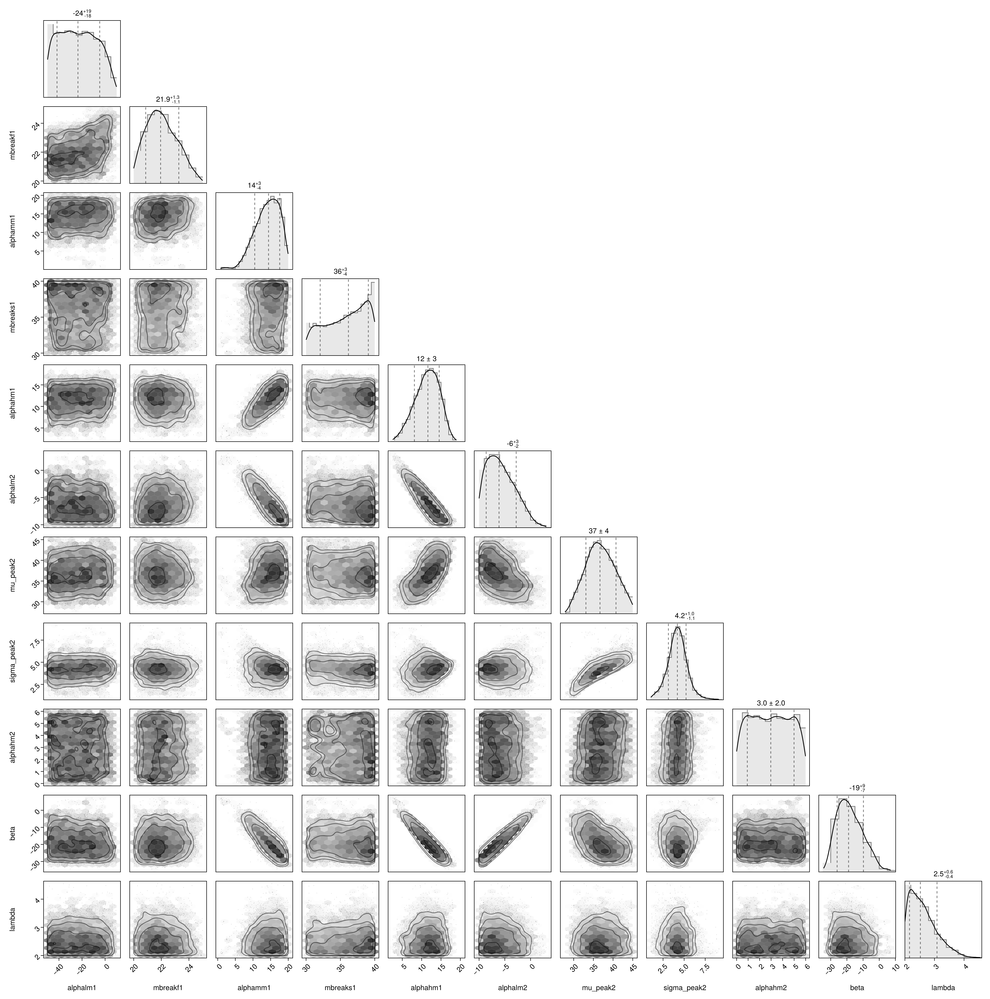

CairoMakie.Screen{IMAGE}


In [4]:
using DataFrames
using PairPlots
using CairoMakie

alphalm1_samples = vec(trace[:posterior][:alphalm1])
mbreakf1_samples = vec(trace[:posterior][:mbreakf1])
alphamm1_samples = vec(trace[:posterior][:alphamm1])
mbreaks1_samples = vec(trace[:posterior][:mbreaks1])
alphahm1_samples = vec(trace[:posterior][:alphahm1])
alphalm2_samples = vec(trace[:posterior][:alphalm2])
mu_peak2_samples = vec(trace[:posterior][:mu_peak2])
sigma_peak2_samples = vec(trace[:posterior][:sigma_peak2])
alphahm2_samples = vec(trace[:posterior][:alphahm2])
beta_samples = vec(trace[:posterior][:beta])
lambda_samples = vec(trace[:posterior][:lambda])

df = DataFrame(
    alphalm1 = alphalm1_samples,
    mbreakf1 = mbreakf1_samples,
    alphamm1 = alphamm1_samples,
    mbreaks1 = mbreaks1_samples,
    alphahm1 = alphahm1_samples,
    alphalm2 = alphalm2_samples,
    mu_peak2 = mu_peak2_samples,
    sigma_peak2 = sigma_peak2_samples,
    alphahm2 = alphahm2_samples,
    beta = beta_samples,
    lambda = lambda_samples
)

fig = PairPlots.pairplot(df)
if plot_save
    save(outdir * "corner.pdf", fig, px_per_unit=3)
end
display(fig)

## $m_1$ Marginal

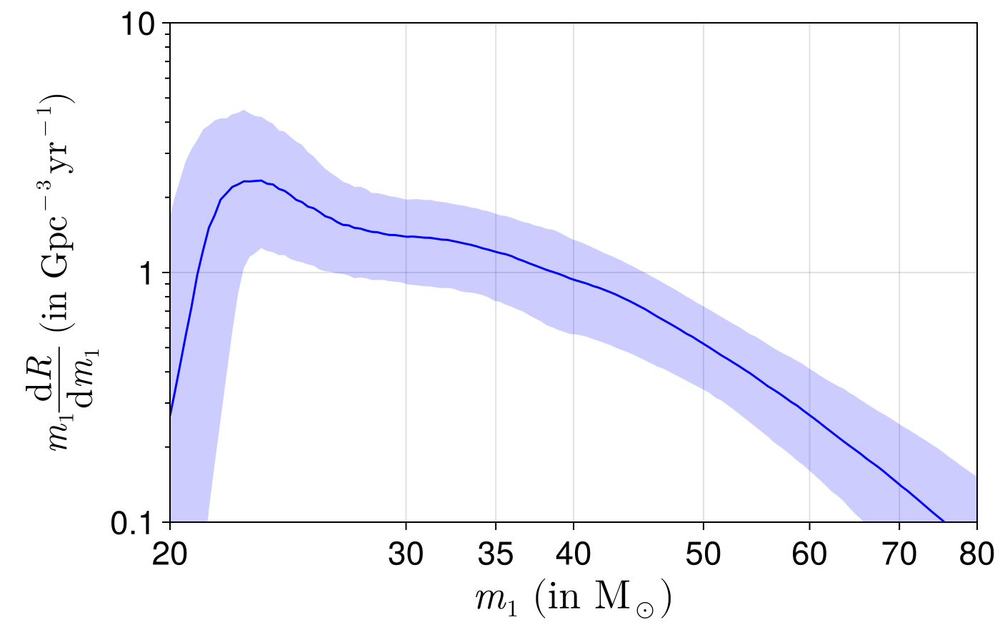

In [6]:
z_plot = 0.0
function marginal_m1_plot_paper(trace; limits=(20.0, 80.0, 0.1, 10.0), yticks=[0.01, 0.1, 1, 10, 100], yminorticks=[0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,2,3,4,5,6,7,8,9,20], kwargs...)
    f = Figure(size=(700, 450))
    a = Axis(f[1,1],
    xlabel = L"m_1~(\mathrm{in~}\mathrm{M}_\odot)",
    ylabel = L"m_1 \frac{\mathrm{d} R}{\mathrm{d} m_1}~(\mathrm{in~}\mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1})",
    xscale = log10, yscale = log10,
    xticks = [20, 30, 35, 40, 50, 60, 70, 80], xtickformat = "{:.0f}",
    yticks = ([0.01, 0.1, 1.0, 10.0, 100.0], ["0.01", "0.1", "1", "10", "100"]),
    yminorticks = yminorticks, yminorticksvisible = true,
    xlabelsize = 28,
    ylabelsize = 25,
    xticklabelsize = xticklabelsize,
    yticklabelsize = yticklabelsize,
    limits = limits)

    marginal_m1_plot_paper!(a, trace; kwargs...)

    # axislegend(a, position = :lb, labelsize = 21, framevisible = true)  # top-right inside the plot

    f
end


function marginal_m1_plot_paper!(a, trace; z_plot=z_plot, ms=exp.(log(m_bh_min):0.01:log(m_bh_max)), qs=0.001:0.01:1, draws=1000, rng=Random.default_rng(), color=Makie.wong_colors()[1], label="Median")
    p = trace.posterior
    dNdm1_matrix = zeros(length(ms), draws)

    @progress for i in 1:draws
        d = rand(rng, span(dims(p, :draw)))
        c = rand(rng, 1:length(dims(p, :chain)))
        log_dN = log_dN_from_chain_sample(trace, d, c)

        dNdm1 = map(ms) do m
            integrand = map(qs) do q
                m2 = q * m
                if m2 < m_bh_min
                    zero(m)
                else
                    exp(log_dN(m, q, z_plot))
                end
            end
            m * p.R[chain=c, draw=d] * trapz(qs, integrand)
        end

        dNdm1_matrix[:, i] = dNdm1
    end

    q5 = mapslices(x -> quantile(x, 0.05), dNdm1_matrix; dims=2)[:]
    q50 = mapslices(x -> quantile(x, 0.50), dNdm1_matrix; dims=2)[:]
    q95 = mapslices(x -> quantile(x, 0.95), dNdm1_matrix; dims=2)[:]

    band!(a, ms, q5, q95, color=(:blue, 0.2), label=L"\mathrm{This~Work}: 35\,\mathrm{M}_{\odot} \mathrm{Pop}")
    lines!(a, ms, q50, color=:blue)
    
end

f = marginal_m1_plot_paper(trace)
if plot_save
    save(outdir * "m1_marginal_population.pdf", f, px_per_unit=3)
end
f

## $m_2$ Marginals

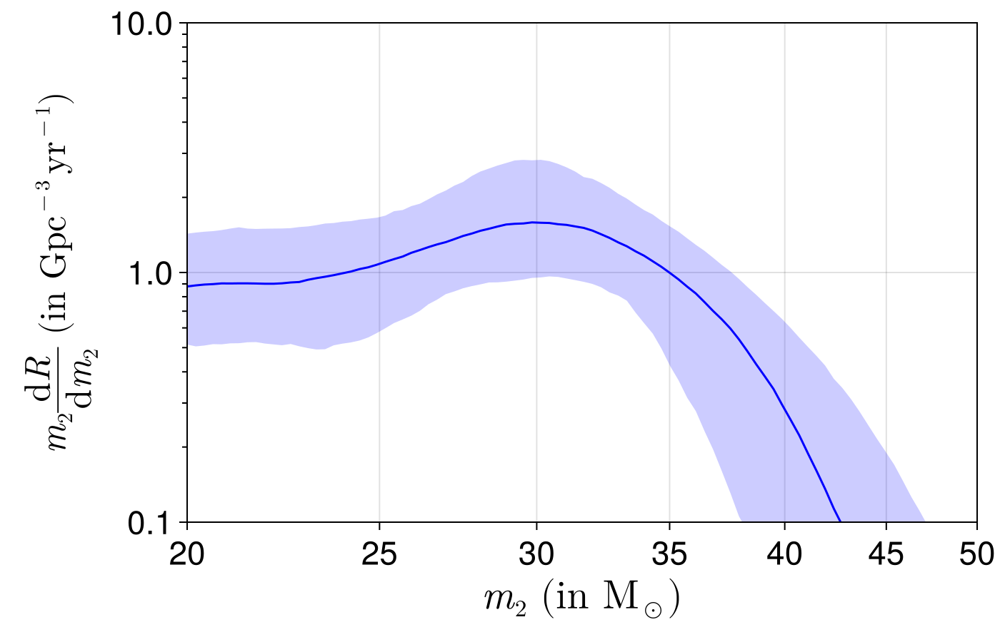

In [7]:
z_plot = 0.0

function marginal_m2_plot_paper(trace;
    limits=(20.0, 50.0, 0.1, 10.0),
    yticks=[0.01, 0.1, 1, 10, 100],
    yminorticks=[0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,2,3,4,5,6,7,8,9,20],
    kwargs...
)
    f = Figure(size=(700, 450))
    a = Axis(f[1,1],
        xlabel = L"m_2~(\mathrm{in~}\mathrm{M}_\odot)",
        ylabel = L"m_2 \frac{\mathrm{d} R}{\mathrm{d} m_2}~(\mathrm{in~}\mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1})",
        xscale = log10, yscale = log10,
        xticks = [20, 25, 30, 35, 40, 45, 50],
        xtickformat = "{:.0f}",
        yticks = (yticks, string.(yticks)),
        yminorticks = yminorticks,
        yminorticksvisible = true,
        xlabelsize = 28,
        ylabelsize = 25,
        xticklabelsize = xticklabelsize,
        yticklabelsize = yticklabelsize,
        limits = limits
    )

    marginal_m2_plot_paper!(a, trace; kwargs...)

    f
end


function marginal_m2_plot_paper!(a, trace;
    z_plot=z_plot,
    ms=exp.(log(20.0):0.01:log(50.0)),   # grid limited to 20–50 Msun
    qs=0.001:0.01:1,
    draws=1000,
    rng=Random.default_rng(),
    color=Makie.wong_colors()[2],
    label=L"\mathrm{This~Work}: 35\,\mathrm{M}_{\odot} \mathrm{Pop}"
)
    p = trace.posterior
    dNdm2_matrix = zeros(length(ms), draws)

    @progress for i in 1:draws
        d = rand(rng, span(dims(p, :draw)))
        c = rand(rng, 1:length(dims(p, :chain)))
        log_dN = log_dN_from_chain_sample(trace, d, c)

        dNdm2 = map(ms) do m2
            integrand = map(qs) do q
                m1 = m2 / q
                if m1 < m_bh_min || m1 > m_bh_max
                    zero(m2)
                else
                    exp(log_dN(m1, q, z_plot)) / q
                end
            end
            m2 * p.R[chain=c, draw=d] * trapz(qs, integrand)
        end

        dNdm2_matrix[:, i] = dNdm2
    end

    q5 = mapslices(x -> quantile(x, 0.05), dNdm2_matrix; dims=2)[:]
    q50 = mapslices(x -> quantile(x, 0.50), dNdm2_matrix; dims=2)[:]
    q95 = mapslices(x -> quantile(x, 0.95), dNdm2_matrix; dims=2)[:]

    band!(a, ms, q5, q95, color=(:blue, 0.2))
    lines!(a, ms, q50, color=:blue, label=label)
end

f = marginal_m2_plot_paper(trace)
if plot_save
    save(outdir * "m2_marginal_population.pdf", f, px_per_unit=3)
end
f


## $m_1$ and $m_2$ Marginals

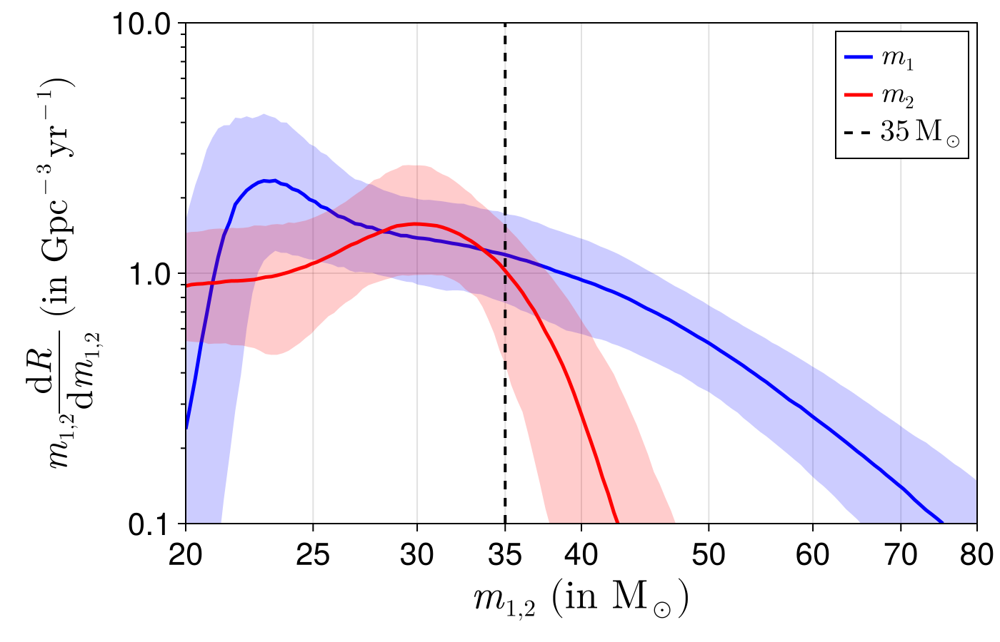

In [8]:
z_plot = 0.0

function marginal_m1m2_plot_paper(trace;
    limits=(20.0, 80.0, 0.1, 10.0),
    yticks=[0.01, 0.1, 1, 10, 100],
    yminorticks=[0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,
                 0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,2,3,4,5,6,7,8,9,20],
    draws=1000,
    rng=Random.default_rng()
)
    f = Figure(size=(700, 450))
    a = Axis(f[1,1],
        xlabel = L"m_{1,2}~(\mathrm{in~}\mathrm{M}_\odot)",
        ylabel = L"m_{1,2} \frac{\mathrm{d} R}{\mathrm{d} m_{1,2}}~(\mathrm{in~}\mathrm{Gpc}^{-3}\,\mathrm{yr}^{-1})",
        xscale = log10, yscale = log10,
        xticks = [20, 25, 30, 35, 40, 50, 60, 70, 80],
        xtickformat = "{:.0f}",
        yticks = (yticks, string.(yticks)),
        yminorticks = yminorticks, yminorticksvisible = true,
        xlabelsize = 28, ylabelsize = 25,
        xticklabelsize = 22, yticklabelsize = 22,
        limits = limits
    )

    # m1
    marginal_component_plot!(a, trace; kind=:m1, z_plot=z_plot,
        ms=exp.(log(m_bh_min):0.01:log(m_bh_max)),
        qs=0.001:0.01:1,
        draws=draws,
        rng=rng,
        color=:blue,
        label=L"m_1"
    )

    # m2
    marginal_component_plot!(a, trace; kind=:m2, z_plot=z_plot,
        ms=exp.(log(20.0):0.01:log(m_bh_max)),
        qs=0.001:0.01:1,
        draws=draws,
        rng=rng,
        color=:red,
        label=L"m_2"
    )

    # vertical line at 35
    vlines!(a, [35.0], color=:black, linewidth=2, linestyle=:dash, label=L"35\,\mathrm{M}_\odot")

    axislegend(a, position=:rt, labelsize=21, framevisible=true)

    f
end


function marginal_component_plot!(a, trace;
    kind::Symbol, z_plot,
    ms, qs, draws,
    rng, color, label
)
    p = trace.posterior
    dN_matrix = zeros(length(ms), draws)

    @progress for i in 1:draws
        d = rand(rng, span(dims(p, :draw)))
        c = rand(rng, 1:length(dims(p, :chain)))
        log_dN = log_dN_from_chain_sample(trace, d, c)

        vals = map(ms) do m
            integrand = map(qs) do q
                if kind == :m1
                    m2 = q * m
                    if m2 < m_bh_min
                        zero(m)
                    else
                        exp(log_dN(m, q, z_plot))
                    end
                elseif kind == :m2
                    m1 = m / q
                    if m1 < m_bh_min || m1 > m_bh_max
                        zero(m)
                    else
                        exp(log_dN(m1, q, z_plot)) / q
                    end
                end
            end
            m * p.R[chain=c, draw=d] * trapz(qs, integrand)
        end

        dN_matrix[:, i] = vals
    end

    q5 = mapslices(x -> quantile(x, 0.05), dN_matrix; dims=2)[:]
    q50 = mapslices(x -> quantile(x, 0.50), dN_matrix; dims=2)[:]
    q95 = mapslices(x -> quantile(x, 0.95), dN_matrix; dims=2)[:]

    band!(a, ms, q5, q95, color=(color, 0.2))
    lines!(a, ms, q50, color=color, linewidth=2.5, label=label)
end

f = marginal_m1m2_plot_paper(trace)
if plot_save
    save(outdir * "m1m2_marginal_population.pdf", f, px_per_unit=3)
end
f


## Marginal $q$

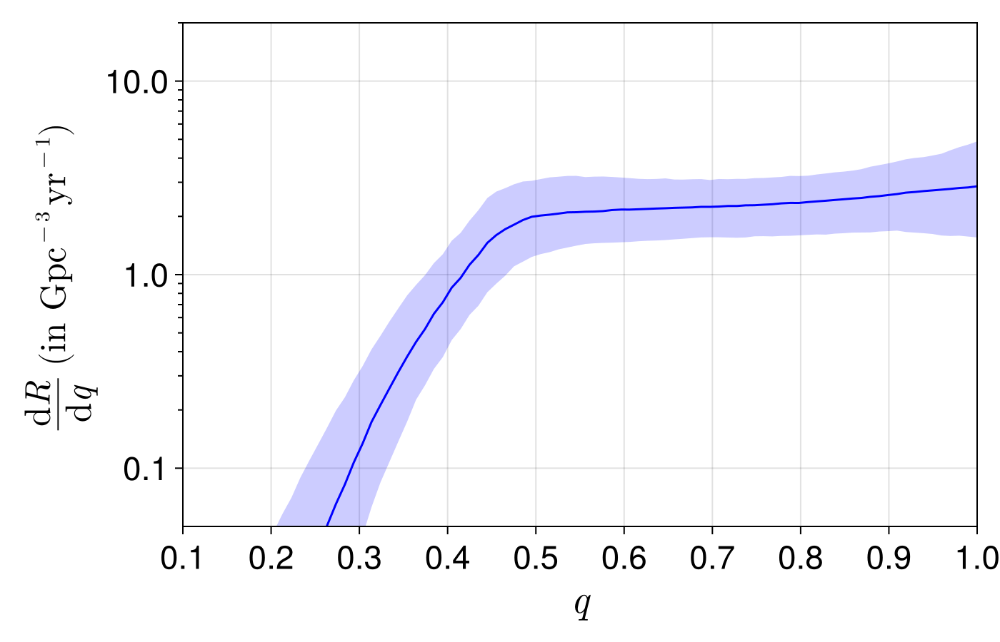

In [9]:
z_plot = 0.0
function marginal_q_plot_paper(trace; z_plot=z_plot, ms=exp.(log(m_bh_min):0.01:log(m_bh_max)), qs=collect(range(0.001, stop=1.0, length=100)), draws=draws, rng=Random.default_rng(), limits=(0.1, 1, 0.05, 20), yticks=[0.1, 1, 10, 100, 1000, 10000], yminorticks=[0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,2,3,4,5,6,7,8,9,20,30,40,50,60,70,80,90,200,300,400,500,600,700,800,900,2000,3000,4000,5000,6000,7000,8000,9000], color=Makie.wong_colors()[1])
    
    f = Figure(size=(700, 450))
    
    a = Axis(f[1,1],
        xlabel = L"q",
        ylabel = L"\frac{\mathrm{d} R}{\mathrm{d} q}~(\mathrm{in~}\mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1})",
        yscale = log10,
        yticks = yticks,
        yminorticks = yminorticks,
        yminorticksvisible = true,
        ytickformat = "{:.1f}",
        xlabelsize = 28,
        ylabelsize = 25,
        xticklabelsize = xticklabelsize,
        yticklabelsize = yticklabelsize,
        limits = limits
    )

    p = trace.posterior
    dNdq_matrix = zeros(length(qs), draws)

    @progress for i in 1:draws
        d = rand(rng, span(dims(p, :draw)))
        c = rand(rng, span(dims(p, :chain)))
        log_dN = log_dN_from_chain_sample(trace, d, c)

        dNdq = map(qs) do q
            integrand = map(ms) do m
                m2 = q * m
                if m2 < m_bh_min
                    zero(m)
                else
                    exp(log_dN(m, q, z_plot))
                end
            end
            p.R[chain=c, draw=d] * trapz(ms, integrand)
        end

        dNdq_matrix[:, i] = dNdq
    end

    # Compute quantiles
    q5 = mapslices(x -> quantile(x, 0.05), dNdq_matrix; dims=2)[:]
    q50 = mapslices(x -> quantile(x, 0.50), dNdq_matrix; dims=2)[:]
    q95 = mapslices(x -> quantile(x, 0.95), dNdq_matrix; dims=2)[:]

    band!(a, qs, q5, q95, color=(:blue, 0.2), label=L"\mathrm{This~Work}: 35\,\mathrm{M}_{\odot} \mathrm{Pop}")
    lines!(a, qs, q50, color=:blue)
    
    return f

end

f = marginal_q_plot_paper(trace)
if plot_save
    save(outdir * "q_marginal_population.pdf", f, px_per_unit=3)
end
f


## Marginal $z$

imin = 39


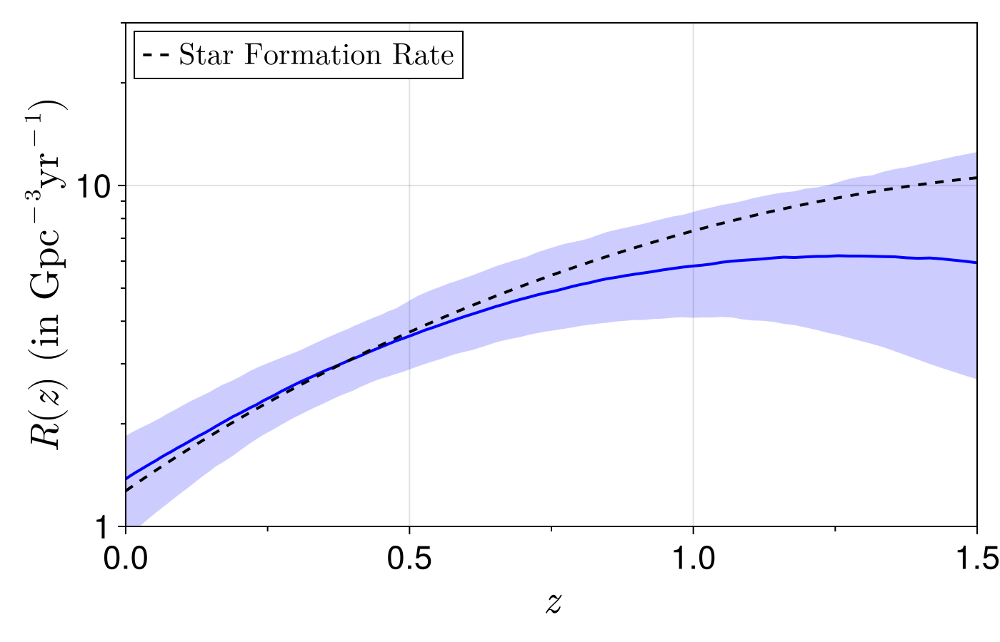

In [10]:
function marginal_z_plot_paper(trace;
    ms = exp.(log(m_bh_min):0.01:log(m_bh_max)),
    qs = 0.001:0.01:1,
    zs = expm1.(range(log(1), stop=log(1 + 2), length=128)),
    draws = draws,
    rng = Random.default_rng(),
    limits = (0, 1.5, 1, 30),
    yticks = [1, 10, 100, 1000],
    yminorticks = [2,3,4,5,6,7,8,9,20,30,40,50,60,70,80,90,200,300,400,500,600,700,800,900],
    plot_md_line = true,
    color = Makie.wong_colors()[1]
)
    f = Figure(size=(700, 450))
    a = Axis(f[1, 1],
        xlabel = L"z",
        ylabel = L"R(z)~(\mathrm{in~}\mathrm{Gpc}^{-3}\mathrm{yr}^{-1})",
        yscale = log10,
        xlabelsize = 28,
        ylabelsize = 28,
        xticklabelsize = xticklabelsize,
        yticklabelsize = yticklabelsize,
        ytickformat = "{:.0f}",
        yticks = yticks,
        yminorticks = yminorticks,
        yminorticksvisible = true,
        xminorticksvisible = true,
        limits = limits
    )

    p = trace.posterior
    dNs = zeros(length(zs), draws)

    @progress for j in 1:draws
        c = rand(rng, span(dims(p, :chain)))
        d = rand(rng, span(dims(p, :draw)))
        log_dN = log_dN_from_chain_sample(trace, d, c)

        z1 = zs[1]
        dNdms = map(ms) do m
            integrand = map(qs) do q
                m2 = q * m
                if m2 < m_bh_min
                    zero(m)
                else
                    exp(log_dN(m, q, z1))
                end
            end
            trapz(qs, integrand)
        end

        norm = trace.posterior.R[draw=d, chain=c] *
               trapz(ms, dNdms) /
               exp(log_dN(m_plot, q_plot, z1))

        dNdz = map(zs) do z
            norm * exp(log_dN(m_plot, q_plot, z))
        end

        dNs[:, j] = dNdz
    end

    #imin = argmin(Rz_95 - Rz_5)
    vs = vec(var(log.(dNs), dims=2))
    imin = argmin(vs)
    @show imin
    
    medians = mapslices(median, dNs; dims=2)[:]
    lowers = mapslices(x -> quantile(x, 0.05), dNs; dims=2)[:]
    uppers = mapslices(x -> quantile(x, 0.95), dNs; dims=2)[:]
    norm = medians[imin]


    band_plot = band!(a, zs, lowers, uppers, color=(:blue, 0.2))
    median_plot = lines!(a, zs, medians, color=:blue, linewidth=2)

    sfr_plot = nothing
    if plot_md_line
        mds = @. (1 + zs)^2.7 / (1 + ((1 + zs)/(1 + 1.9))^5.6)
        mds = mds .* norm ./ mds[imin]

        sfr_plot = lines!(a, zs, mds, color=:black, linestyle=:dash, linewidth=2, label=L"\mathrm{Star~Formation~Rate}")
    end

    axislegend(a, position = :lt, labelsize = 21, framevisible = true)
    
    return f
end

f = marginal_z_plot_paper(trace)
if plot_save
    save(outdir * "z_marginal_population.pdf", f, px_per_unit=3)
end
f

## Print Median, 5% and 95% Values

In [11]:
function summarize_trace(trace)
    println("Parameter\tMedian ± Errors")
    for (name, values) in pairs(trace.posterior)
        flat_values = vec(Array(values))  # flatten all chains and draws
        median_val = median(flat_values)
        lower_val = quantile(flat_values, 0.05)
        upper_val = quantile(flat_values, 0.95)
        lower_err = median_val - lower_val
        upper_err = upper_val - median_val
        # Print in LaTeX-style format: median^{+upper_err}_{-lower_err}
        println("$(name)\t$(round(median_val, sigdigits=5))^{+$(round(upper_err, sigdigits=5))}_{-$(round(lower_err, sigdigits=5))}")
    end
end

summarize_trace (generic function with 1 method)

In [12]:
summarize_trace(trace)

Parameter	Median ± Errors
mbreakf1	21.948^{+2.0515}_{-1.5714}
sigma_peak2	4.1994^{+1.8573}_{-1.907}
alphahm2	2.9713^{+2.6787}_{-2.6789}
m1_draw	36.763^{+30.211}_{-14.182}
alphalm2	-6.1236^{+5.3045}_{-3.3441}
Neff_samps	34.362^{+132.45}_{-21.336}
log_rlm2	-3.8027^{+1.7033}_{-0.72653}
alphahm1	11.613^{+4.3791}_{-5.7528}
lambda	2.5235^{+0.99631}_{-0.47745}
m2s	29.377^{+10.035}_{-16.85}
qs	0.76789^{+0.20484}_{-0.34444}
kappa	6.0724^{+1.7484}_{-2.7133}
alphalm1	-23.549^{+26.323}_{-24.371}
rlm2	0.022311^{+0.10023}_{-0.011522}
mbreaks1	36.17^{+3.539}_{-5.5474}
R	162.88^{+10322.0}_{-156.34}
m1s	36.679^{+32.936}_{-13.852}
rhm2	0.094195^{+0.34868}_{-0.081648}
alphamm1	14.411^{+4.3836}_{-6.3313}
Neff_sel	1969.5^{+549.06}_{-656.26}
q_draw	0.7675^{+0.2077}_{-0.35908}
log_rhm2	-2.3624^{+1.5479}_{-2.0159}
beta	-18.964^{+15.053}_{-10.271}
zs	0.44723^{+0.56384}_{-0.3004}
m2_draw	29.152^{+10.284}_{-16.288}
z_draw	0.44296^{+0.68059}_{-0.30945}
zp	1.2686^{+2.0068}_{-0.25217}
mu_peak2	36.684^{+6.4103}_{-5.

# Compare different $p_{cut}$

In [13]:
trace_samples_0p1 = from_netcdf(joinpath(@__DIR__, "..", "data", "chains_0.1.nc"))
ne_min = dropdims(minimum(trace_samples_0p1.posterior.Neff_samps, dims=(:chain, :draw)); dims=(:chain, :draw))
ns_min = minimum(trace_samples_0p1.posterior.Neff_sel)
@info "p_cut = 0.1, minimum Neff_samps: $(round(minimum(ne_min), digits=2)), minimum Neff_sel = $(round(ns_min, digits=1)), 4*Nobs = $(4*length(dims(trace_samples_0p1.posterior, :event)))"

┌ Info: p_cut = 0.1, minimum Neff_samps: 4.08, minimum Neff_sel = 635.3, 4*Nobs = 504
└ @ Main /mnt/home/sroy1/GWTC4_35_m1m2z/correlated_pairing/m2_peak/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X22sdnNjb2RlLXJlbW90ZQ==.jl:4


In [14]:
trace_samples_0p9 = from_netcdf(joinpath(@__DIR__, "..", "data", "chains.nc"))
ne_min = dropdims(minimum(trace_samples_0p9.posterior.Neff_samps, dims=(:chain, :draw)); dims=(:chain, :draw))
ns_min = minimum(trace_samples_0p9.posterior.Neff_sel)
@info "p_cut = 0.9, minimum Neff_samps: $(round(minimum(ne_min), digits=2)), minimum Neff_sel = $(round(ns_min, digits=1)), 4*Nobs = $(4*length(dims(trace_samples_0p9.posterior, :event)))"

┌ Info: p_cut = 0.9, minimum Neff_samps: 4.0, minimum Neff_sel = 770.1, 4*Nobs = 380
└ @ Main /mnt/home/sroy1/GWTC4_35_m1m2z/correlated_pairing/m2_peak/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X31sdnNjb2RlLXJlbW90ZQ==.jl:4


## Corner plot

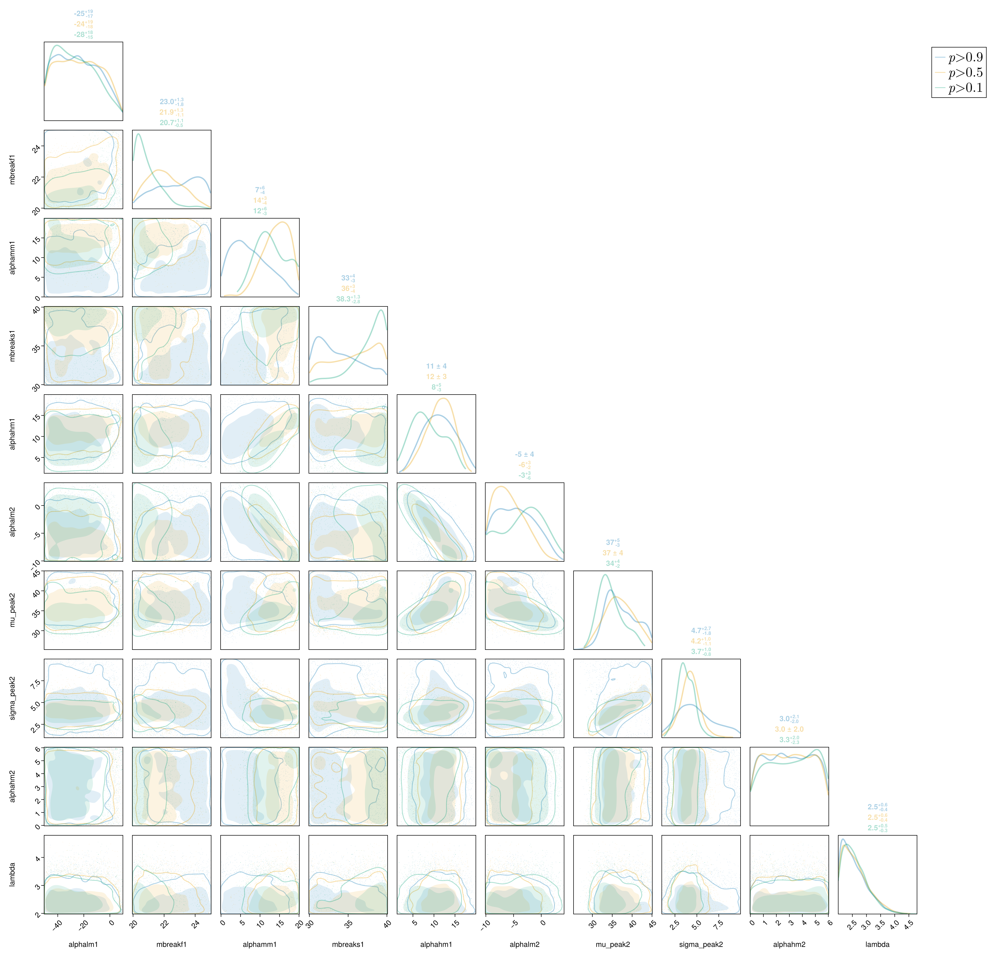

In [15]:
## Corner Compare Selection
corner_params = [
    :alphalm1,
    :mbreakf1,
    :alphamm1,
    :mbreaks1,
    :alphahm1,
    :alphalm2,
    :mu_peak2,
    :sigma_peak2,
    :alphahm2,
    :lambda
] 

c1 = Makie.wong_colors(0.33)[1]
c2 = Makie.wong_colors(0.33)[2]
c3 = Makie.wong_colors(0.33)[3]

f = pairplot(
    PairPlots.Series(
        DataFrame(
            [k => vec(trace_samples_0p9.posterior[k]) for k in corner_params]...
        ),
        label=L"p > 0.9",
        color=c1,
        strokecolor=c1
    ),
    PairPlots.Series(
        DataFrame(
            [k => vec(trace.posterior[k]) for k in corner_params]...
        ),
        label=L"p > 0.5",
        color=c2,
        strokecolor=c2
    ),
    PairPlots.Series(
        DataFrame(
            [k => vec(trace_samples_0p1.posterior[k]) for k in corner_params]...
        ),
        label=L"p > 0.1",
        color=c3,
        strokecolor=c3
    );
    legend = (; position=:rt, labelsize=26, margin=(10, 10, 10, 10)),
)

if plot_save
    save(outdir * "corner_compare_selection.pdf", f, px_per_unit=3)
end

f


## $m_1$ marginals

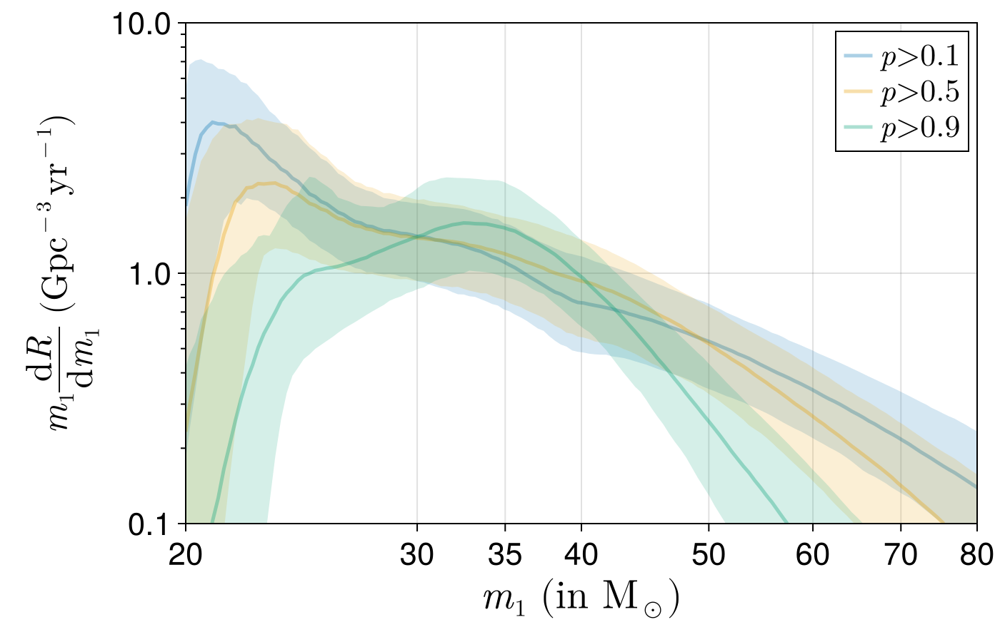

In [16]:
z_plot = 0.0

function marginal_m1_compare_plot(traces;
    labels = [L"p > 0.1", L"p > 0.5", L"p > 0.9"],
    colors = Makie.wong_colors(0.33),
    draws = 1000,
    limits = (20.0, 80.0, 0.1, 10.0),
    yticks = [0.01, 0.1, 1, 10, 100],
    yminorticks = [0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,
                   0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,2,3,4,5,6,7,8,9,20],
    z_plot = 0.0
)

    f = Figure(size = (700, 450))
    a = Axis(f[1, 1],
        xlabel = L"m_1~(\mathrm{in~M}_\odot)",
        ylabel = L"m_1 \frac{\mathrm{d} R}{\mathrm{d} m_1}~(\mathrm{Gpc}^{-3}\,\mathrm{yr}^{-1})",
        xscale = log10, yscale = log10,
        xticks = [20, 30, 35, 40, 50, 60, 70, 80], xtickformat = "{:.0f}",
        yticks = (yticks, string.(yticks)),
        yminorticks = yminorticks, yminorticksvisible = true,
        xlabelsize = 28, ylabelsize = 25,
        xticklabelsize = 22, yticklabelsize = 22,
        limits = limits
    )

    ms = exp.(log(m_bh_min):0.01:log(m_bh_max))
    qs = 0.001:0.01:1

    for (i, trace) in enumerate(traces)
        color = colors[i]
        label = labels[i]
        marginal_m1_plot_paper!(a, trace;
            ms = ms, qs = qs, draws = draws, z_plot = z_plot,
            color = color, label = label)
    end

    axislegend(a, position = :rt, labelsize = 22, framevisible = true)
    return f
end


function marginal_m1_plot_paper!(a, trace;
    z_plot = 0.0,
    ms = exp.(log(m_bh_min):0.01:log(m_bh_max)),
    qs = 0.001:0.01:1,
    draws = 1000,
    rng = Random.default_rng(),
    color = :blue,
    label = L"\mathrm{Population}"
)
    p = trace.posterior
    dNdm1_matrix = zeros(length(ms), draws)

    @progress for i in 1:draws
        d = rand(rng, span(dims(p, :draw)))
        c = rand(rng, 1:length(dims(p, :chain)))
        log_dN = log_dN_from_chain_sample(trace, d, c)

        dNdm1 = map(ms) do m
            integrand = map(qs) do q
                m2 = q * m
                if m2 < m_bh_min
                    0.0
                else
                    exp(log_dN(m, q, z_plot))
                end
            end
            m * p.R[chain=c, draw=d] * trapz(qs, integrand)
        end

        dNdm1_matrix[:, i] = dNdm1
    end

    q5  = mapslices(x -> quantile(x, 0.05), dNdm1_matrix; dims=2)[:]
    q50 = mapslices(x -> quantile(x, 0.50), dNdm1_matrix; dims=2)[:]
    q95 = mapslices(x -> quantile(x, 0.95), dNdm1_matrix; dims=2)[:]

    band!(a, ms, q5, q95, color = (color, 0.5))
    lines!(a, ms, q50, color = color, linewidth = 2.5, label = label)
end

f = marginal_m1_compare_plot(
    [trace_samples_0p1, trace, trace_samples_0p9];
    labels = [L"p > 0.1", L"p > 0.5", L"p > 0.9"]
)

if plot_save
    save(outdir * "m1_marginal_population_compare.pdf", f, px_per_unit = 3)
end
f


## $m_2$ Marginals

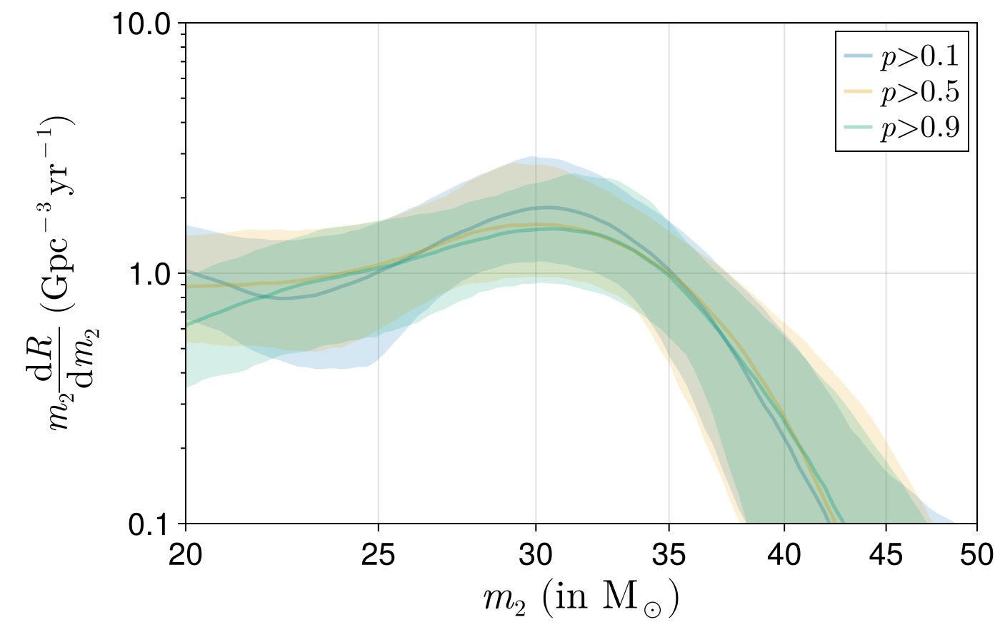

In [17]:
z_plot = 0.0

function marginal_m2_compare_plot(traces;
    labels = [L"p > 0.1", L"p > 0.5", L"p > 0.9"],
    colors = Makie.wong_colors(0.33),
    draws = 1000,
    limits = (20.0, 50.0, 0.1, 10.0),
    yticks = [0.01, 0.1, 1, 10, 100],
    yminorticks = [0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,
                   0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,2,3,4,5,6,7,8,9,20],
    z_plot = 0.0
)

    f = Figure(size = (700, 450))
    a = Axis(f[1, 1],
        xlabel = L"m_2~(\mathrm{in~M}_\odot)",
        ylabel = L"m_2 \frac{\mathrm{d} R}{\mathrm{d} m_2}~(\mathrm{Gpc}^{-3}\,\mathrm{yr}^{-1})",
        xscale = log10, yscale = log10,
        xticks = [20, 25, 30, 35, 40, 45, 50], xtickformat = "{:.0f}",
        yticks = (yticks, string.(yticks)),
        yminorticks = yminorticks, yminorticksvisible = true,
        xlabelsize = 28, ylabelsize = 25,
        xticklabelsize = 22, yticklabelsize = 22,
        limits = limits
    )

    ms = exp.(log(20.0):0.01:log(50.0))   # grid restricted to 20–50 M⊙
    qs = 0.001:0.01:1

    for (i, trace) in enumerate(traces)
        color = colors[i]
        label = labels[i]
        marginal_m2_plot_paper!(a, trace;
            ms = ms, qs = qs, draws = draws, z_plot = z_plot,
            color = color, label = label)
    end

    axislegend(a, position = :rt, labelsize = 22, framevisible = true)
    return f
end


function marginal_m2_plot_paper!(a, trace;
    z_plot = 0.0,
    ms = exp.(log(20.0):0.01:log(50.0)),
    qs = 0.001:0.01:1,
    draws = 1000,
    rng = Random.default_rng(),
    color = :blue,
    label = L"\mathrm{Population}"
)
    p = trace.posterior
    dNdm2_matrix = zeros(length(ms), draws)

    @progress for i in 1:draws
        d = rand(rng, span(dims(p, :draw)))
        c = rand(rng, 1:length(dims(p, :chain)))
        log_dN = log_dN_from_chain_sample(trace, d, c)

        dNdm2 = map(ms) do m2
            integrand = map(qs) do q
                m1 = m2 / q
                if m1 < m_bh_min || m1 > m_bh_max
                    0.0
                else
                    exp(log_dN(m1, q, z_plot)) / q
                end
            end
            m2 * p.R[chain=c, draw=d] * trapz(qs, integrand)
        end

        dNdm2_matrix[:, i] = dNdm2
    end

    q5  = mapslices(x -> quantile(x, 0.05), dNdm2_matrix; dims=2)[:]
    q50 = mapslices(x -> quantile(x, 0.50), dNdm2_matrix; dims=2)[:]
    q95 = mapslices(x -> quantile(x, 0.95), dNdm2_matrix; dims=2)[:]

    band!(a, ms, q5, q95, color = (color, 0.5))
    lines!(a, ms, q50, color = color, linewidth = 2.5, label = label)
end

f = marginal_m2_compare_plot(
    [trace_samples_0p1, trace, trace_samples_0p9];
    labels = [L"p > 0.1", L"p > 0.5", L"p > 0.9"]
)

if plot_save
    save(outdir * "m2_marginal_population_compare.pdf", f, px_per_unit = 3)
end

f

## $q$ Marginals

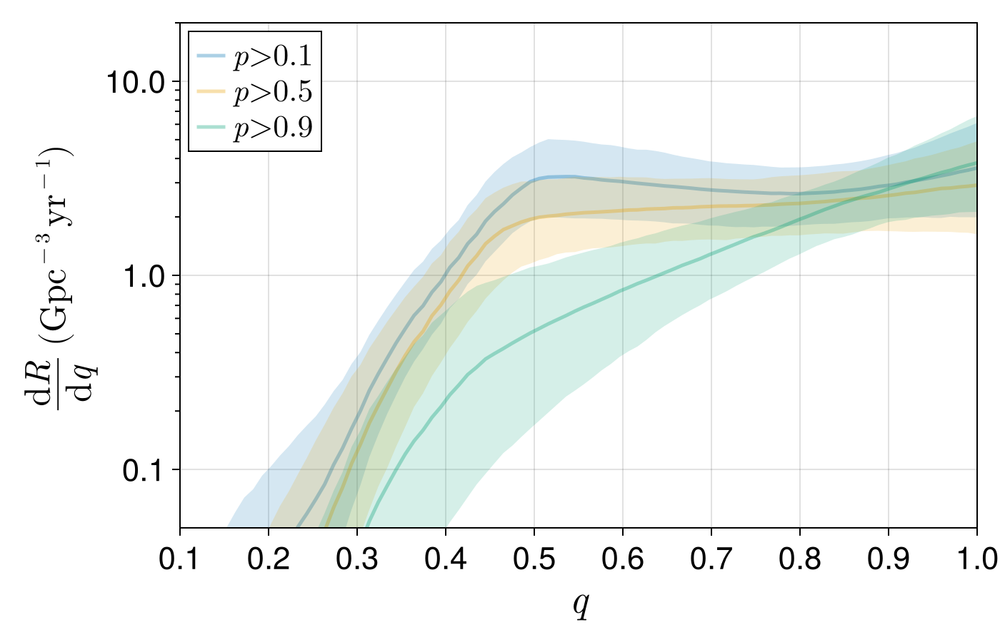

In [18]:
z_plot = 0.0

function marginal_q_compare_plot(traces;
    labels = [L"p > 0.1", L"p > 0.5", L"p > 0.9"],
    colors = Makie.wong_colors(0.33),
    draws = 1000,
    limits = (0.1, 1.0, 0.05, 20.0),
    yticks = [0.1, 1, 10, 100, 1000, 10000],
    yminorticks = [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,
                   2,3,4,5,6,7,8,9,20,30,40,50,60,
                   70,80,90,200,300,400,500,600,700,
                   800,900,2000,3000,4000,5000,6000,
                   7000,8000,9000],
    z_plot = 0.0
)

    f = Figure(size = (700, 450))
    a = Axis(f[1, 1],
        xlabel = L"q",
        ylabel = L"\frac{\mathrm{d} R}{\mathrm{d} q}~(\mathrm{Gpc}^{-3}\,\mathrm{yr}^{-1})",
        yscale = log10,
        yticks = yticks,                     # ← just numbers
        yminorticks = yminorticks,
        yminorticksvisible = true,
        ytickformat = "{:.1f}",
        xlabelsize = 28, ylabelsize = 25,
        xticklabelsize = 22, yticklabelsize = 22,
        limits = limits
    )

    qs = collect(range(0.001, stop=1.0, length=100))
    ms = exp.(log(m_bh_min):0.01:log(m_bh_max))

    for (i, trace) in enumerate(traces)
        color = colors[i]
        label = labels[i]
        marginal_q_plot_paper!(a, trace;
            ms = ms, qs = qs, draws = draws,
            z_plot = z_plot, color = color, label = label)
    end

    axislegend(a, position = :lt, labelsize = 22, framevisible = true)
    return f
end

function marginal_q_plot_paper!(a, trace;
    z_plot = 0.0,
    ms = exp.(log(m_bh_min):0.01:log(m_bh_max)),
    qs = collect(range(0.001, stop=1.0, length=100)),
    draws = 1000,
    rng = Random.default_rng(),
    color = :blue,
    label = L"\mathrm{Population}"
)
    p = trace.posterior
    dNdq_matrix = zeros(length(qs), draws)

    @progress for i in 1:draws
        d = rand(rng, span(dims(p, :draw)))
        c = rand(rng, 1:length(dims(p, :chain)))
        log_dN = log_dN_from_chain_sample(trace, d, c)

        dNdq = map(qs) do q
            integrand = map(ms) do m
                m2 = q * m
                if m2 < m_bh_min
                    0.0
                else
                    exp(log_dN(m, q, z_plot))
                end
            end
            p.R[chain=c, draw=d] * trapz(ms, integrand)
        end

        dNdq_matrix[:, i] = dNdq
    end

    q5  = mapslices(x -> quantile(x, 0.05), dNdq_matrix; dims=2)[:]
    q50 = mapslices(x -> quantile(x, 0.50), dNdq_matrix; dims=2)[:]
    q95 = mapslices(x -> quantile(x, 0.95), dNdq_matrix; dims=2)[:]

    band!(a, qs, q5, q95, color = (color, 0.5))
    lines!(a, qs, q50, color = color, linewidth = 2.5, label = label)
end

f = marginal_q_compare_plot(
    [trace_samples_0p1, trace, trace_samples_0p9];
    labels = [L"p > 0.1", L"p > 0.5", L"p > 0.9"]
)

if plot_save
    save(outdir * "q_marginal_population_compare.pdf", f, px_per_unit = 3)
end

f

## $z$ Marginals

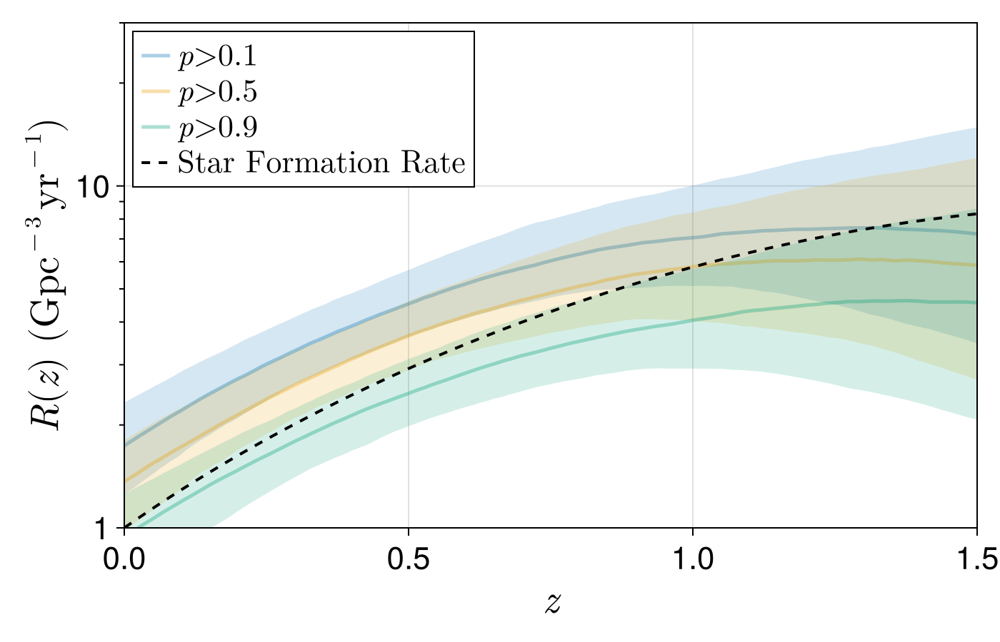

In [19]:
function marginal_z_compare_plot(traces;
    labels = [L"p > 0.1", L"p > 0.5", L"p > 0.9"],
    colors = Makie.wong_colors(0.33),
    draws = 1000,
    limits = (0.0, 1.5, 1.0, 30.0),
    yticks = [1, 10, 100, 1000],
    yminorticks = [2,3,4,5,6,7,8,9,20,30,40,50,60,70,80,90,
                   200,300,400,500,600,700,800,900],
    plot_md_line = true,
    m_plot = 30.0,
    q_plot = 0.5
)
    f = Figure(size = (700, 450))
    a = Axis(f[1, 1],
        xlabel = L"z",
        ylabel = L"R(z)~(\mathrm{Gpc}^{-3}\,\mathrm{yr}^{-1})",
        yscale = log10,
        yticks = yticks,
        yminorticks = yminorticks,
        yminorticksvisible = true,
        xlabelsize = 28, ylabelsize = 28,
        xticklabelsize = 22, yticklabelsize = 22,
        limits = limits
    )

    zs = expm1.(range(log(1), stop = log(1 + 2), length = 128))
    ms = exp.(log(m_bh_min):0.01:log(m_bh_max))
    qs = 0.001:0.01:1

    # --- plot population posteriors ---
    for (i, trace) in enumerate(traces)
        color = colors[i]
        label = labels[i]
        marginal_z_plot_paper!(a, trace;
            ms = ms, qs = qs, zs = zs, draws = draws,
            color = color, label = label,
            m_plot = m_plot, q_plot = q_plot,
            plot_md_line = false)   # disable inside
    end

    # --- plot SFR line *after all population curves* ---
    if plot_md_line
        vs = vec(var(log.(exp.(range(log(1), stop = log(1 + 2), length = 128))), dims=1))  # dummy, for clarity
        imin = 1  # or recompute based on last trace’s dNs if you store it
        mds = @. (1 + zs)^2.7 / (1 + ((1 + zs)/(1 + 1.9))^5.6)
        norm = 1.0  # adjust normalization if you saved it
        mds = mds .* norm ./ mds[imin]
        lines!(a, zs, mds, color=:black, linestyle=:dash, linewidth=2,
               label=L"\mathrm{Star~Formation~Rate}")
    end

    axislegend(a, position = :lt, labelsize = 22, framevisible = true)
    return f
end

function marginal_z_plot_paper!(a, trace;
    ms, qs, zs,
    draws = 1000,
    rng = Random.default_rng(),
    color = :blue,
    label = L"\mathrm{Population}",
    m_plot = 30.0,
    q_plot = 0.5,
    plot_md_line = false
)
    p = trace.posterior
    dNs = zeros(length(zs), draws)

    @progress for j in 1:draws
        c = rand(rng, span(dims(p, :chain)))
        d = rand(rng, span(dims(p, :draw)))
        log_dN = log_dN_from_chain_sample(trace, d, c)

        # Compute normalization at z1
        z1 = zs[1]
        dNdms = map(ms) do m
            integrand = map(qs) do q
                m2 = q * m
                if m2 < m_bh_min
                    0.0
                else
                    exp(log_dN(m, q, z1))
                end
            end
            trapz(qs, integrand)
        end

        norm = trace.posterior.R[draw=d, chain=c] *
               trapz(ms, dNdms) /
               exp(log_dN(m_plot, q_plot, z1))

        dNdz = map(zs) do z
            norm * exp(log_dN(m_plot, q_plot, z))
        end

        dNs[:, j] = dNdz
    end

    vs = vec(var(log.(dNs), dims=2))
    imin = argmin(vs)

    medians = mapslices(median, dNs; dims=2)[:]
    lowers  = mapslices(x -> quantile(x, 0.05), dNs; dims=2)[:]
    uppers  = mapslices(x -> quantile(x, 0.95), dNs; dims=2)[:]
    norm = medians[imin]

    band!(a, zs, lowers, uppers, color = (color, 0.5))
    lines!(a, zs, medians, color = color, linewidth = 2.5, label = label)

    if plot_md_line
        mds = @. (1 + zs)^2.7 / (1 + ((1 + zs)/(1 + 1.9))^5.6)
        mds = mds .* norm ./ mds[imin]
        lines!(a, zs, mds, color = :black, linestyle = :dash, linewidth = 2,
               label = L"\mathrm{Star~Formation~Rate}")
    end
end

f = marginal_z_compare_plot(
    [trace_samples_0p1, trace, trace_samples_0p9];
    labels = [L"p > 0.1", L"p > 0.5", L"p > 0.9"]
)

if plot_save
    save(outdir * "z_marginal_population_compare.pdf", f, px_per_unit = 3)
end

f